# Download and unpack files (Colab)

In [ ]:
!wget https://www.dropbox.com/s/bl8ql79jejuqid4/data.zip

In [ ]:
!unzip data.zip -d .

In [ ]:
!pip install -r helpers/requirements_colab.txt

# Setup model

In [22]:
# Setup and instantiate the network model
import torch
from torch import nn
from torch.autograd import Variable
import os
from helpers import dataset as ds
from helpers import datapreparation as dp
import numpy as np
import time

class Generalist(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, batch_size):
        super(Generalist, self).__init__()
        self.input_size = input_size
        self.output_size = input_size
        self.hidden_size = hidden_size
        self.num_layers = num_layers
        self.batch_size = batch_size
        self.rnn = nn.LSTM(input_size, hidden_size, num_layers)#, dropout=0.25)
        #self.rnn = nn.GRU(input_size, hidden_size, num_layers)
        #self.notes_encoder = nn.Linear(in_features=input_size, out_features=hidden_size)
        self.notes_decoder = nn.Linear(hidden_size, self.output_size)
        #self.out1 = nn.ReLU()
        self.out2 = nn.Sigmoid()
        self.hidden = self.init_hidden()

    def init_hidden(self, tag=None):
        return (Variable(torch.zeros(self.num_layers, self.batch_size, self.hidden_size)).cuda(),
                Variable(torch.zeros(self.num_layers, self.batch_size, self.hidden_size)).cuda())

    def forward(self, input_sequence):
        output, self.hidden = self.rnn(input_sequence, self.hidden)
        #output = self.out1(output)
        output = self.notes_decoder(output)
        output = self.out2(output)
        return output
    
class Specialist(Generalist):
    def __init__(self, input_size, hidden_size, num_layers, batch_size, num_tags):
        super(Specialist, self).__init__(input_size, hidden_size, num_layers, batch_size)
        self.num_tags = num_tags
        self.tag_embedding = nn.Embedding(num_tags, hidden_size)
        
    def init_hidden(self, tag=None):
        # initialize hidden state (probably not cell state) with tag (hidden first?)
        if tag is None:
            embedding = torch.zeros(self.num_layers, self.batch_size, self.hidden_size)
        else:
            embedding = self.tag_embedding(tag)
            embedding = torch.cat([embedding for l in range(self.num_layers)])
        
        return (Variable(embedding).cuda(),
                Variable(torch.zeros(self.num_layers, self.batch_size, self.hidden_size)).cuda())
    
dirpath = os.path.join('datasets', 'training', 'piano_roll_fs5')
X = ds.pianoroll_dataset_batch(dirpath)
input_size = int(X.num_keys())
hidden_size = 256
num_layers = 2
batch_size = 1
num_tags = int(X.num_tags())

model = Specialist(input_size, hidden_size, num_layers, batch_size, num_tags).cuda()

tensor([[0]])
tensor([[ 2.5026, -0.9556,  1.0939, -1.2694, -0.2246,  0.4105, -1.9408,  0.2203,
         -0.7180,  0.0033,  0.5166,  0.4642, -1.2160, -0.9553,  0.7708,  0.5544,
         -0.6787,  0.6485, -0.4106,  0.7751,  0.2887, -0.3673,  0.4720,  0.9346,
          0.5200,  0.0094, -0.5711, -0.6818,  1.5974, -1.6513, -0.6923,  0.5355,
         -1.7103,  1.8639, -0.9270,  0.3266,  0.7692, -0.1928,  0.3275, -1.1540,
         -1.5533,  0.7710,  0.2046,  0.5090,  1.8803, -0.1068, -0.0185,  1.1741,
          0.6496, -0.3967,  0.1204,  0.8589, -0.3353, -0.3156,  0.0270, -1.5176,
         -0.0877, -0.0679, -0.3070,  1.1327,  1.0113,  2.1384, -1.4956,  0.1206,
         -0.1057,  0.2551, -0.8768, -0.5370,  0.2540,  0.0223,  1.6816, -0.5759,
          0.0155, -1.1088, -0.1408,  1.4244,  1.2480,  0.4460,  0.0338,  0.9712,
         -1.0940, -0.1324, -0.2765,  1.0673,  0.0829, -1.5196,  0.8793, -0.5877,
          0.0102, -1.1875, -1.2186,  1.1781,  0.0860,  0.4951,  1.1362, -0.6554,
          0.73

# Save/load

In [55]:
torch.save(model.state_dict(), 'SpecState_32_c64_16')

In [31]:
gen_dict = torch.load('GenState256_32_BCE_c32_0')
spec_dict = model.state_dict()
spec_dict.update(gen_dict)
model.load_state_dict(spec_dict)

# Train model

In [34]:
# Instantiate hyperparameters
loss_func = nn.BCELoss()
#loss_func = nn.BCEWithLogitsLoss()
#loss_func = nn.MSELoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
#optimizer = torch.optim.SGD(model.parameters(), lr=1e-3, momentum=0.1) 
#optimizer = torch.optim.RMSprop(model.parameters(), lr=1e-3)

#for song_x, tag, song_y in X:
  #print(len(song_x), len(song_y))
  #print((song_x[-1] - song_y[-2]).squeeze(1).cpu().data.numpy().sum())

In [35]:
with torch.no_grad():
    model.hidden = model.init_hidden()
    output = model(X[0][0].cuda()).detach()
    print(output[42])

epochs = 32
chunk_size = 64
chunk_overlap = 16
start = time.time()

for epoch in range(epochs):
    sum_loss = 0
    chunk_count = 0
    for input_sequence, tag, target_sequence in X:
        i = 0
        length = len(input_sequence)
        while i < length:
          j = min(i+chunk_size, length)
          input_seq = input_sequence[i:j]
          target_seq = target_sequence[i:j]
          # Clear accumulated gradients.
          model.zero_grad()

          # Clear hidden state
          model.hidden = model.init_hidden(tag.cuda())

          # Forward pass
          pred_seq = model(input_seq.cuda())

          # Compute loss, gradients and backpropagate
          loss = loss_func(pred_seq.cuda(), target_seq.cuda())
          loss.backward()
          optimizer.step()
          
          # Sum loss for each chunk and iterate
          sum_loss += loss
          chunk_count += 1
          i += chunk_size-chunk_overlap
    
    print('loss: ' + str(sum_loss/(chunk_count)))
    print(str(epoch+1) + '/' + str(epochs))#, end='\r')
    
print("runtime: ", time.time() - start)

with torch.no_grad():
    model.hidden = model.init_hidden()
    output = model(X[0][0].cuda()).detach()
    print(output[42])
    print(X[0][-1][42] > 0)

tensor([[3.1780e-12, 2.6024e-12, 1.4615e-12, 1.1831e-12, 1.6673e-12, 2.6552e-12,
         2.2422e-12, 2.1930e-12, 2.9619e-12, 2.0966e-12, 2.0140e-12, 1.4743e-12,
         1.4786e-12, 2.0186e-12, 1.4619e-12, 2.4276e-12, 2.0886e-12, 1.7092e-12,
         2.3610e-12, 1.4843e-12, 3.0194e-12, 2.4864e-12, 4.6255e-15, 7.4506e-16,
         1.4551e-12, 1.5639e-14, 4.0761e-13, 1.7519e-14, 3.9746e-11, 9.2080e-09,
         2.9258e-11, 1.9857e-11, 2.2096e-12, 2.0272e-09, 2.7102e-10, 3.6664e-08,
         6.5616e-10, 2.8130e-13, 6.8385e-09, 1.5121e-09, 2.5874e-11, 2.3721e-09,
         6.4438e-10, 3.3418e-08, 8.1269e-13, 1.1555e-08, 2.5428e-11, 1.2726e-06,
         2.5924e-10, 1.1779e-11, 2.5606e-07, 2.2670e-11, 4.0246e-10, 1.9293e-06,
         1.4117e-10, 3.7772e-05, 1.0886e-09, 4.0887e-04, 5.2113e-06, 8.5081e-01,
         1.9589e-02, 3.4997e-09, 9.8638e-01, 5.9500e-03, 1.4641e-05, 5.3451e-01,
         2.7130e-07, 3.1726e-02, 9.3448e-07, 7.9375e-04, 4.4970e-11, 2.7816e-05,
         3.9701e-03, 7.0914e

# Test output

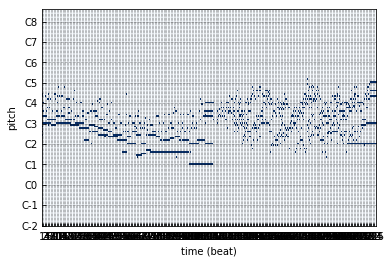

In [39]:
with torch.no_grad():
    model.hidden = model.init_hidden()
    output = model(X[0][0].cuda())

prediction = output.squeeze(1).cpu().data.numpy().T
#prediction = np.array([np.pad(row, (22, 22), 'constant', constant_values=0) for row in prediction])
#prediction /= prediction.max()
prediction = prediction > 0.15
dp.visualize_piano_roll(prediction)

In [ ]:
dp.embed_play_v1(prediction)

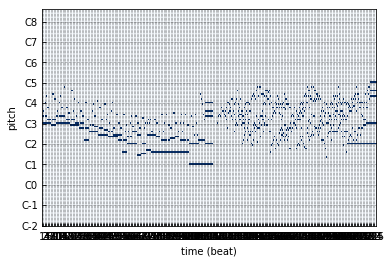

In [33]:
original = X[0][0].squeeze(1).cpu().data.numpy().T
#song = np.array([np.pad(row, (22, 22), 'constant', constant_values=0) for row in original])
dp.visualize_piano_roll(original)

In [ ]:
dp.embed_play_v1(original)

# Compose music

tensor([[ 2.5026, -0.9556,  1.0939, -1.2694, -0.2246,  0.4105, -1.9408,  0.2203,
         -0.7180,  0.0033,  0.5166,  0.4642, -1.2160, -0.9553,  0.7708,  0.5544,
         -0.6787,  0.6485, -0.4106,  0.7751,  0.2887, -0.3673,  0.4720,  0.9346,
          0.5200,  0.0094, -0.5711, -0.6818,  1.5974, -1.6513, -0.6923,  0.5355,
         -1.7103,  1.8639, -0.9270,  0.3266,  0.7692, -0.1928,  0.3275, -1.1540,
         -1.5533,  0.7710,  0.2046,  0.5090,  1.8803, -0.1068, -0.0185,  1.1741,
          0.6496, -0.3967,  0.1204,  0.8589, -0.3353, -0.3156,  0.0270, -1.5176,
         -0.0877, -0.0679, -0.3070,  1.1327,  1.0113,  2.1384, -1.4956,  0.1206,
         -0.1057,  0.2551, -0.8768, -0.5370,  0.2540,  0.0223,  1.6816, -0.5759,
          0.0155, -1.1088, -0.1408,  1.4244,  1.2480,  0.4460,  0.0338,  0.9712,
         -1.0940, -0.1324, -0.2765,  1.0673,  0.0829, -1.5196,  0.8793, -0.5877,
          0.0102, -1.1875, -1.2186,  1.1781,  0.0860,  0.4951,  1.1362, -0.6554,
          0.7380, -0.0110,  

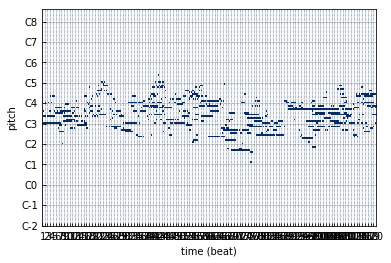

tensor([[ 0.4076,  0.8463, -0.8720, -0.6328,  0.7824, -1.2439,  1.1761, -0.5785,
         -0.8042,  1.9603, -0.4462, -0.1522, -0.7150, -0.3211, -0.8162, -1.0592,
          0.6158, -0.4990, -0.5830,  0.0211,  0.9219,  1.7574,  0.8250, -0.9125,
         -1.2303,  0.4164,  0.0952, -0.2180, -1.1999,  0.4435,  0.5215,  0.2718,
         -1.7867, -0.3191, -0.3604,  1.2639,  1.3636, -1.0962,  0.2848, -1.0758,
          1.8065, -0.8217, -0.5637, -0.2864,  0.1332,  0.9581, -0.1165, -0.0829,
         -0.4299, -0.7518,  0.7356, -1.1913,  0.3939,  0.8220, -0.6768, -0.7265,
         -2.2117,  0.6673,  1.5934,  0.9856,  1.0664,  0.7099, -1.8916,  0.4272,
         -0.0235,  0.0435, -0.4331,  0.2885, -0.8515,  0.6701,  1.1966,  0.7568,
          0.8742,  0.1787, -1.3906,  2.2907,  1.5484, -1.8385,  0.0093, -0.6801,
         -0.3423,  0.0119,  1.0408, -0.0131,  1.4027,  0.4368, -0.9281,  0.3003,
          0.7838, -1.0772, -0.3446, -0.6410, -0.5920,  0.2921, -1.1427, -0.0986,
          0.9589,  1.5890, -

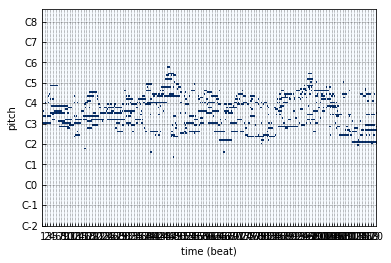

In [57]:
def compose(model, init_song, init_len, max_len, tag):
    composition = []
    with torch.no_grad():
        model.hidden = model.init_hidden(tag.cuda())
        #print(model.hidden[0][0])
        for i in range(max_len+1):
            if i <= init_len:
                notes = init_song[0][i].unsqueeze(0)
            else:
                notes = (output/torch.max(output)).ge(0.2).float()

            composition.append(notes.squeeze().cpu().data.numpy())
            if i < max_len:
              output = model(notes.cuda()).detach()

    return np.array(composition).T

composition1 = compose(model, X[0], 10, 600, X[0][1])
dp.visualize_piano_roll(composition1)
composition2 = compose(model, X[0], 10, 600, X[4][1])
dp.visualize_piano_roll(composition2)

In [48]:
dp.embed_play_v1(composition1)

In [ ]:
dp.embed_play_v1(composition2)